In [1]:
using JLD2, Plots, CurveFit
λc = 0.07885+0.06025im
λ_list = round.(λc .+[i*2e-5 + 1im*j*2e-5 for i=-1:1 for j=-1:1],digits=6)
L_list = 8:12
Op_label  = ["I","σ","ϵ","L-1ϵ"]
data = load("D500results.jld2")
Δth = [0,data["Δσ th "],data[ "Δε th"],data["ΔL1ε th"]]
cth = 1.13754733664723 - 0.0210687419403234im

num_versions = 14
n = length(λ_list)

Δ_list = zeros(ComplexF64,length(L_list),n+num_versions-1,3)
E0_list = zeros(ComplexF64,length(L_list),n+num_versions-1)
for (i,L) in enumerate(L_list)
    for (j,λ) in enumerate(λ_list)
        dataσ = load("QP_Energy_$(L)_100.jld2")
        E0 = dataσ["E0"]
        Eσ = dataσ["Eσ"]
        Eε = dataσ["Eε"][j,1]
        E0_list[i,j] = E0[j]
        Δ_list[i,j,1] = (Eσ .- E0)[j]
        Δ_list[i,j,2] = Eε
    end
    for j = 1:(num_versions-1)
        dataσ = load("QP_Energy_$(L)_100_add$(j+1).jld2")
        E0 = dataσ["E0"]
        Eσ = dataσ["Eσ"]
        Eε = dataσ["Eε"][1,1]
        E0_list[i,n+j] = E0[1]
        Δ_list[i,n+j,1] = (Eσ .- E0)[1]
        Δ_list[i,n+j,2] = Eε
    end
end
for i=2:num_versions
    dataσ = load("QP_Energy_8_100_add$(i).jld2")
    λ = dataσ["lambda_list"][1]
    λ_list = vcat(λ_list,λ)
end
λ_list

22-element Vector{ComplexF64}:
 0.07883 + 0.06023im
 0.07883 + 0.06025im
 0.07883 + 0.06027im
 0.07885 + 0.06023im
 0.07885 + 0.06025im
 0.07885 + 0.06027im
 0.07887 + 0.06023im
 0.07887 + 0.06025im
 0.07887 + 0.06027im
  0.0789 + 0.0603im
         ⋮
 0.07895 + 0.0602im
   0.079 + 0.0602im
   0.079 + 0.06015im
  0.0791 + 0.06015im
  0.0792 + 0.06015im
  0.0792 + 0.0601im
  0.0793 + 0.0601im
  0.0794 + 0.0601im
 0.07905 + 0.06015im

In [2]:
# Δ_list = zeros(ComplexF64,length(L_list),length(λ_list),3)
# E0_list = zeros(ComplexF64,length(L_list),length(λ_list))
# for (i,L) in enumerate(L_list)
#     for (j,λ) in enumerate(λ_list)
#         dataσ = load("QP_Energy_$(L)_100.jld2")
#         E0 = dataσ["E0"]
#         Eσ = dataσ["Eσ"]
#         Eε = dataσ["Eε"][j,1]
#         E0_list[i,j] = E0[j]
#         Δ_list[i,j,1] = (Eσ .- E0)[j]
#         Δ_list[i,j,2] = Eε
#     end
# end

In [3]:
a= load("QP_Energy_$(12)_100.jld2")["Eε"]

9×2 Matrix{ComplexF64}:
 0.624131-0.50969im   0.0+0.0im
 0.624186-0.509849im  0.0+0.0im
 0.624242-0.510008im  0.0+0.0im
 0.623972-0.509746im  0.0+0.0im
 0.624027-0.509905im  0.0+0.0im
 0.624083-0.510064im  0.0+0.0im
 0.623812-0.509801im  0.0+0.0im
 0.623868-0.50996im   0.0+0.0im
 0.623924-0.51012im   0.0+0.0im

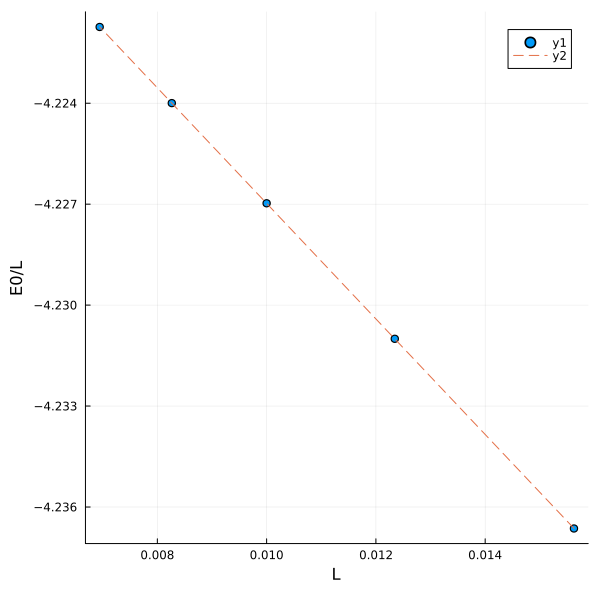

λ_list[ind] = 0.07883 + 0.06027im


In [2]:
# Choose λ
ind = 3

@show λ_list[ind]
#v = 2.8810 − 0.7091im
ϵ0 = E0_list[:,ind]./L_list
ϵ0_re = real(E0_list[:,ind])./L_list
fit = linear_fit(1.0./L_list.^2, ϵ0)

plt = plot(xlabel="L",ylabel="E0/L",size=(600,600))
scatter!(plt,1.0./L_list.^2,ϵ0_re)
plot!(plt,1.0./L_list.^2, real(fit[1] .+ fit[2]./L_list.^2),linestyle=:dash)
display(plt)

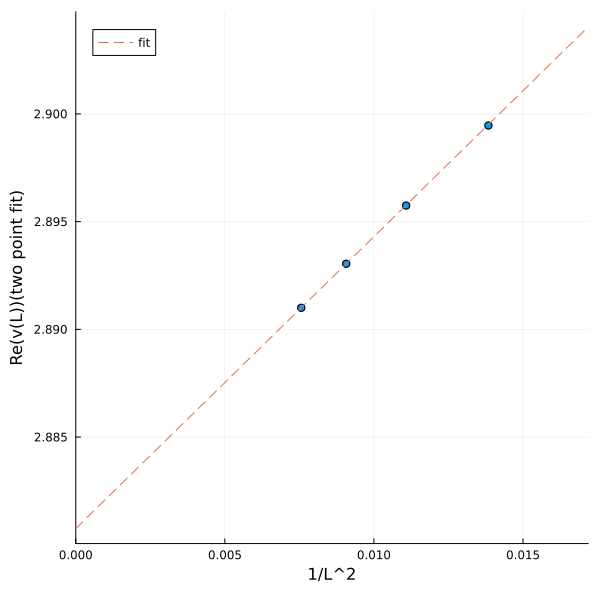

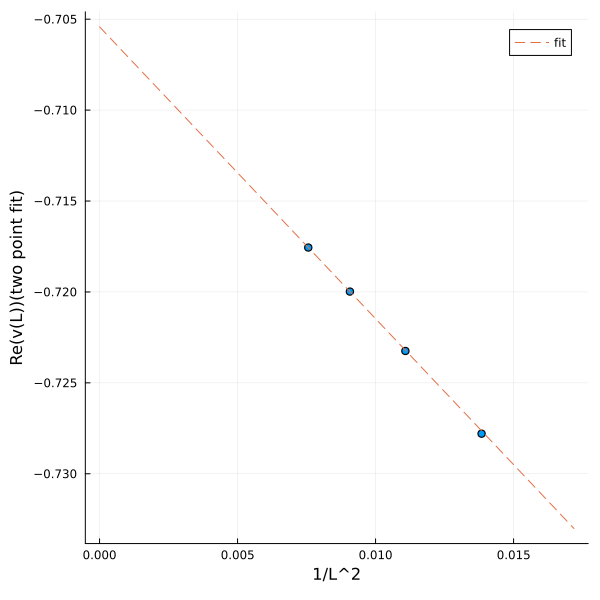

v_extrapolate = 2.880756656750123 - 0.7054221680670467im


In [3]:
fit_start_ind = 3

v_list = []
for i=1:length(L_list)-1
    ini = i
    fit = linear_fit(1.0./L_list[ini:ini+1].^2, ϵ0[ini:ini+1])
    v = -6*fit[2]/π/cth
    push!(v_list,v)
end


Leff = 0.5*(L_list[1:end-1].+L_list[2:end])
fit = linear_fit(1.0./Leff[fit_start_ind:end].^2,v_list[fit_start_ind:end])
v_extrapolate = fit[1]

x_list = LinRange(0,1.1/L_list[1]^2,100)

@show v_extrapolate
plt = plot(xlabel="1/L^2",ylabel="Re(v(L))(two point fit)",size=(600,600),xlims=(0,x_list[end]))
scatter!(plt, 1.0./Leff.^2,real(v_list),label="")
plot!(plt, x_list,real(fit[1].+fit[2].*x_list),linestyle = :dash,label="fit")
display(plt)

plt = plot(xlabel="1/L^2",ylabel="Re(v(L))(two point fit)",size=(600,600))
scatter!(plt, 1.0./Leff.^2,imag(v_list),label="")
plot!(plt, x_list,imag(fit[1].+fit[2].*x_list),linestyle = :dash,label="fit")
display(plt)

### $1/\sqrt2$ * 1im?

In [77]:
using LinearAlgebra
function extrapolation_v(ϵ0 ;fit_start_ind=3)
    v_list = []
    for i=1:length(L_list)-1
        ini = i
        fit = linear_fit(1.0./L_list[ini:ini+1].^2, ϵ0[ini:ini+1])
        v = -6*fit[2]/π/cth
        push!(v_list,v)
    end


    Leff = 0.5*(L_list[1:end-1].+L_list[2:end])
    fit = linear_fit(1.0./Leff[fit_start_ind:end].^2,v_list[fit_start_ind:end])
    v_extrapolate = fit[1]
end
using CurveFit
function plot_gap_scaling(ind; fit_start_ind=2, show_real = true, show_imag = true, num_levels =1, criteria=(1,1))
    v_ex = extrapolation_v(E0_list[:,ind]./L_list;fit_start_ind=1)
    v_range = [v_ex + 0.002*i*1im for i=-4:4]
    l = @layout [a{0.5w} b{0.5w}]
    err_re,err_im = 0,0
    re_criteria,im_criteria = criteria
    plt = plot(xscale=:log10,yscale=:log10,xlabel="L",ylabel="v range in imaginary",size=(800,600),title = "$(λ_list[ind])",layout=l)
    save = []
    for v in v_range
        err_re,err_im = 0,0
            if show_real
            # plt = plot(xscale=:log10,yscale=:log10,xlabel="L",ylabel="Re(δx)",size=(600,400),title = "$(λ_list[ind])")
            δx = [abs.(real(Δ_list[:,ind,i].*L_list/(2π*v)).-real(Δth[i+1])) for i=1:3]
            for i=1:num_levels
                plot!(plt[1],L_list,δx[i],label="") #label=Op_label[i+1]
            end
        # for i=1:num_levels
        #     if i == 1
        #         plot!(plt[1],L_list,δx[i][end]*(L_list/L_list[end]).^(-2),color=:black,label="∝ L^(-2)",linestyle=:dash)
        #     else
        #         plot!(plt[1],L_list,δx[i][end]*(L_list/L_list[end]).^(-2),color=:black,label="",linestyle=:dash)
        #     end
        # end
            err_re = sum([norm(δx[i].-δx[i][end]*(L_list/L_list[end]))^2 for i=1:num_levels])
            if v == v_ex
                for i=1:num_levels
                push!(save,δx[i][end])
                end
            end
            end
           
    # for i=1:2
    #     fit = linear_fit(1 ./L_list[end-1:end].^2, δx[i][end-1:end])
    #     err_re += sum(abs(1/δx[i][j] * (δx[i][j] - fit[2]/L_list[j]^2 - fit[1])) for j=1:length(L_list))
    # end
        if show_imag
        # plt = plot(xscale=:log10,yscale=:log10,xlabel="L",ylabel="Im(δx)",size=(600,400),title="$(λ_list[ind])")
        δx = [abs.(imag(Δ_list[:,ind,i].*L_list/(2π*v)).-imag(Δth[i+1])) for i=1:3]
        for i=1:num_levels
            plot!(plt[2],L_list,δx[i],label = "")#label=Op_label[i+1]
        end
        # for i=1:num_levels
        #     if i == 1
        #         plot!(plt[2],L_list,δx[i][end]*(L_list/L_list[end]).^(-2),color=:black,label="∝ L^(-2)",linestyle=:dash)
        #     else
        #         plot!(plt[2],L_list,δx[i][end]*(L_list/L_list[end]).^(-2),color=:black,label="",linestyle=:dash)
        #     end
        # end
        err_im = sum([norm(δx[i].-δx[i][end]*(L_list/L_list[end]))^2 for i=1:num_levels])
        end
    # for i=1:2
    #     fit = linear_fit(1 ./L_list[end-1:end].^2, δx[i][end-1:end])
    #     err_im += sum(abs(1/δx[i][j] * (δx[i][j] - fit[2]/L_list[j]^2 - fit[1])) for j=1:length(L_list))
    # end
    # @info err_re,err_im
    # if err_re < re_criteria && err_im < im_criteria
    #     @info v-v_ex
    #     display(plt)
    # end
   if v == v_ex
    for i=1:num_levels
    save[i] += δx[i][end]*1im
    end
   end
end
 for i=1:num_levels
            if i == 1
                plot!(plt[1],L_list,real(save[i])*(L_list/L_list[end]).^(-2),color=:black,label="∝ L^(-2)",linestyle=:dash)
            else
                plot!(plt[1],L_list,real(save[i])*(L_list/L_list[end]).^(-2),color=:black,label="",linestyle=:dash)
            end
            if i == 1
                plot!(plt[2],L_list,imag(save[i])*(L_list/L_list[end]).^(-2),color=:black,label="∝ L^(-2)",linestyle=:dash)
            else
                plot!(plt[2],L_list,imag(save[i])*(L_list/L_list[end]).^(-2),color=:black,label="",linestyle=:dash)
            end
        end
        display(plt)
    return err_re,err_im
end

plot_gap_scaling (generic function with 1 method)

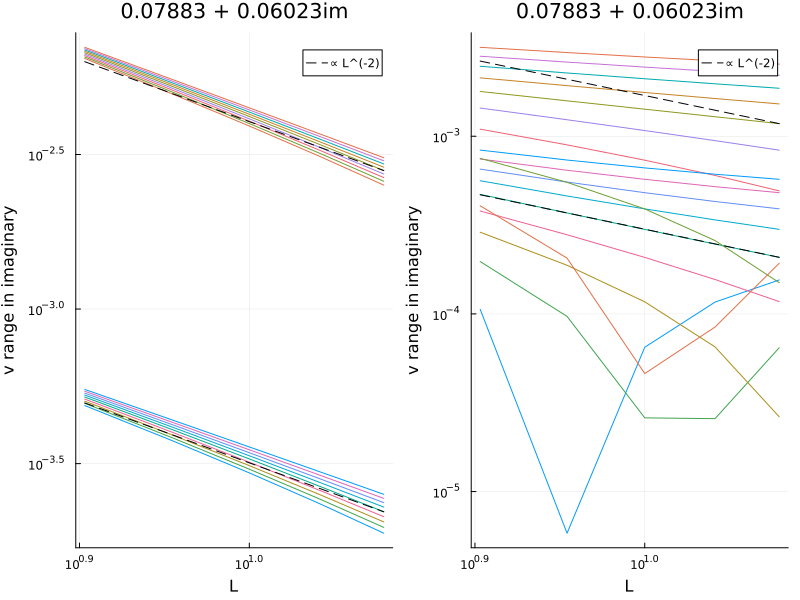

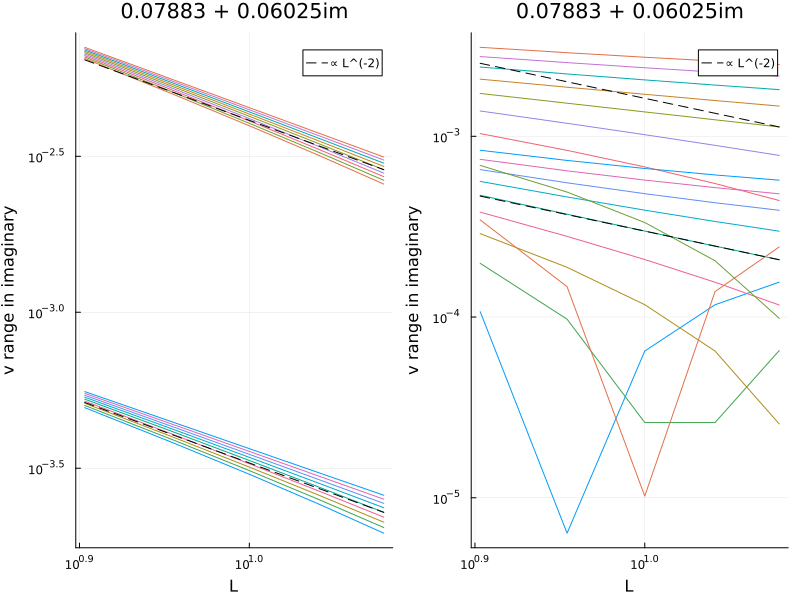

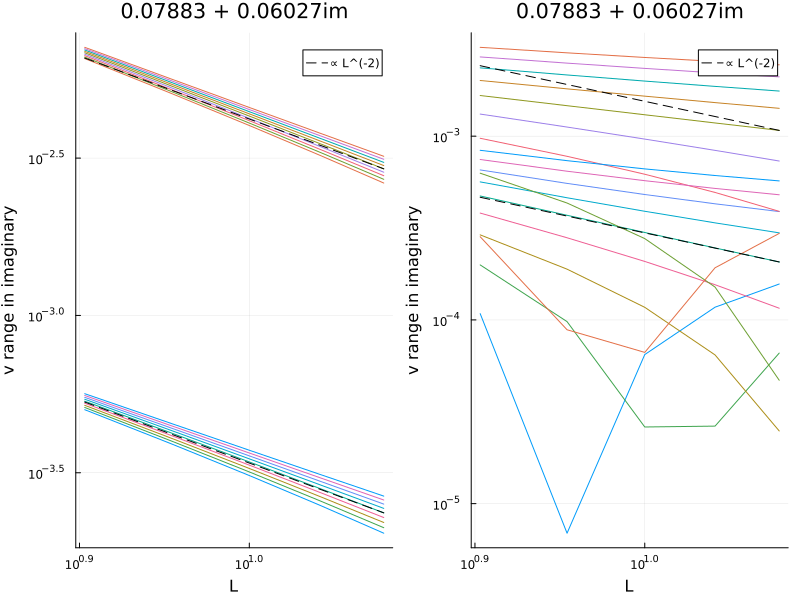

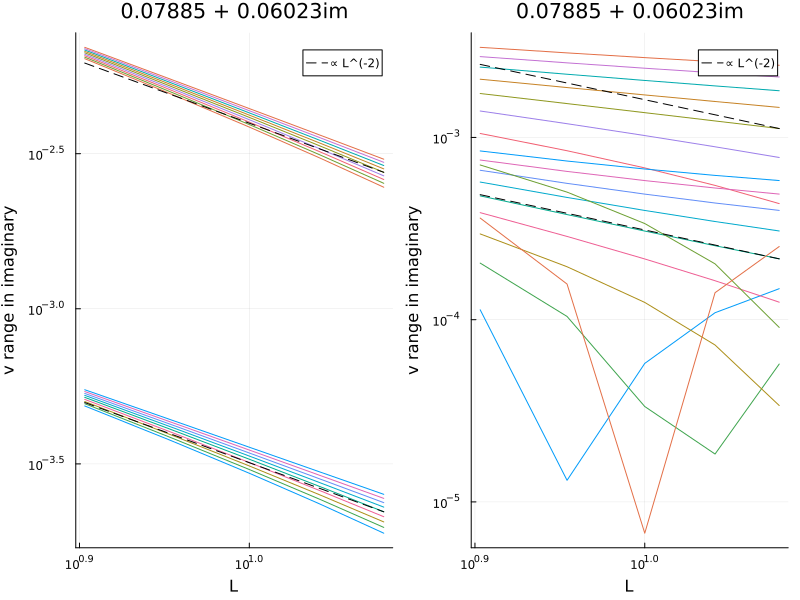

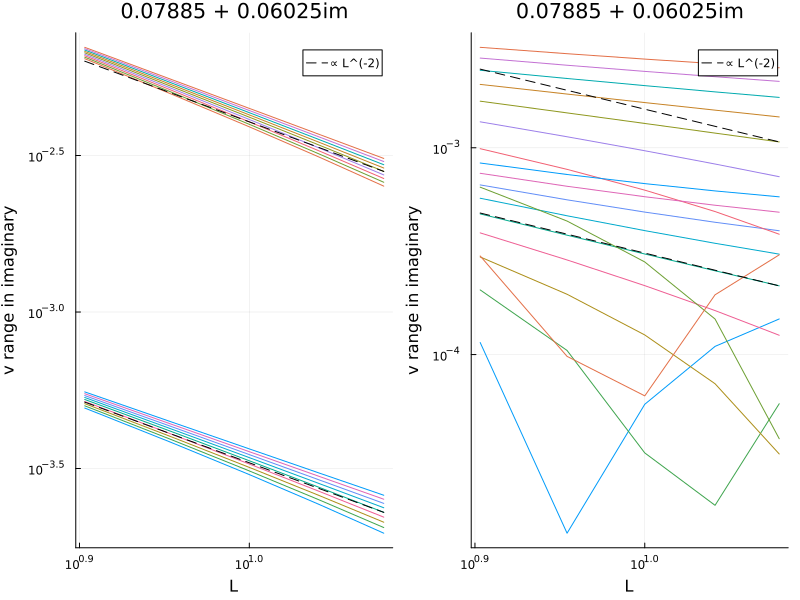

...

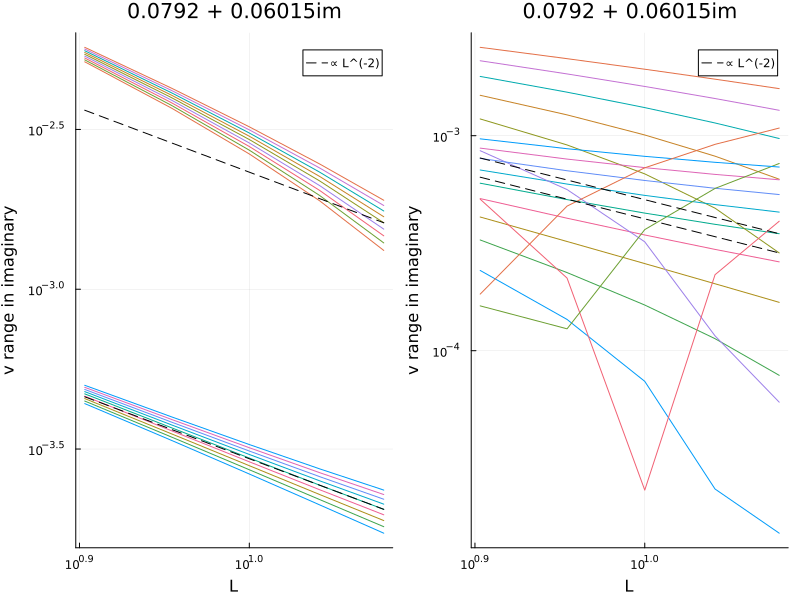

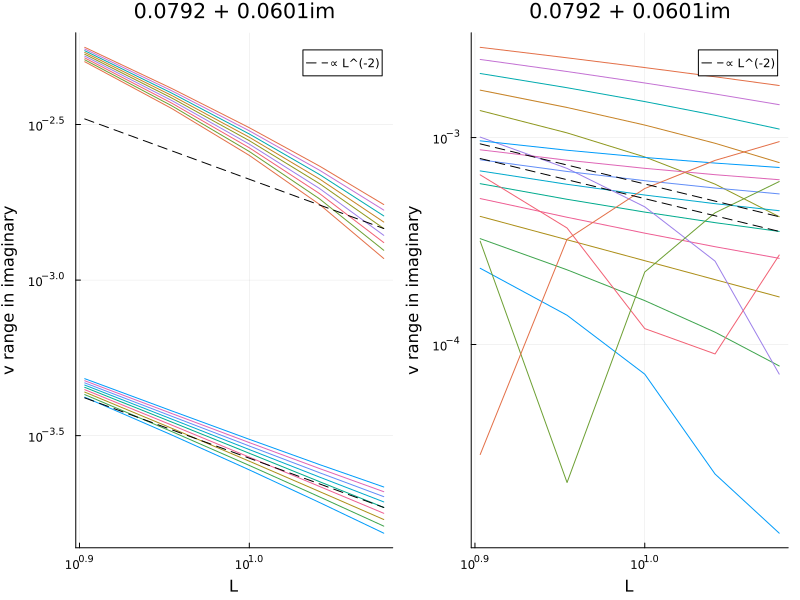

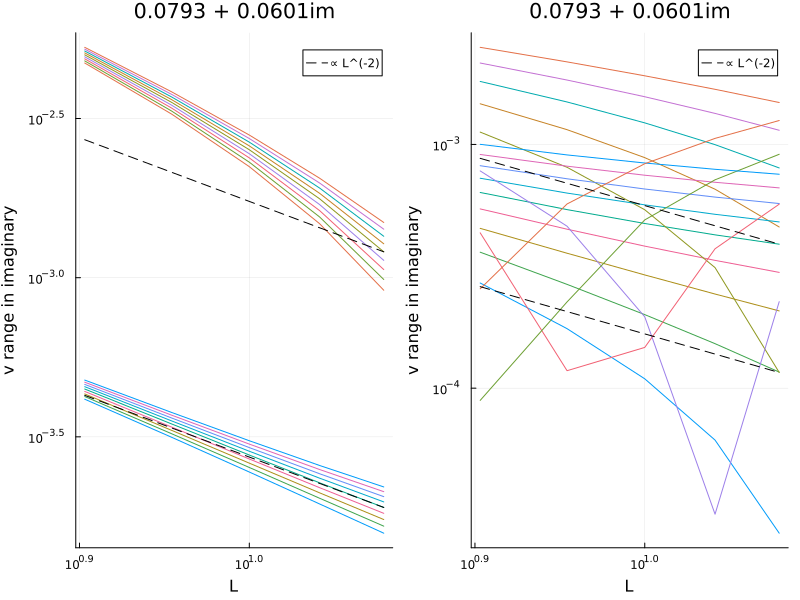

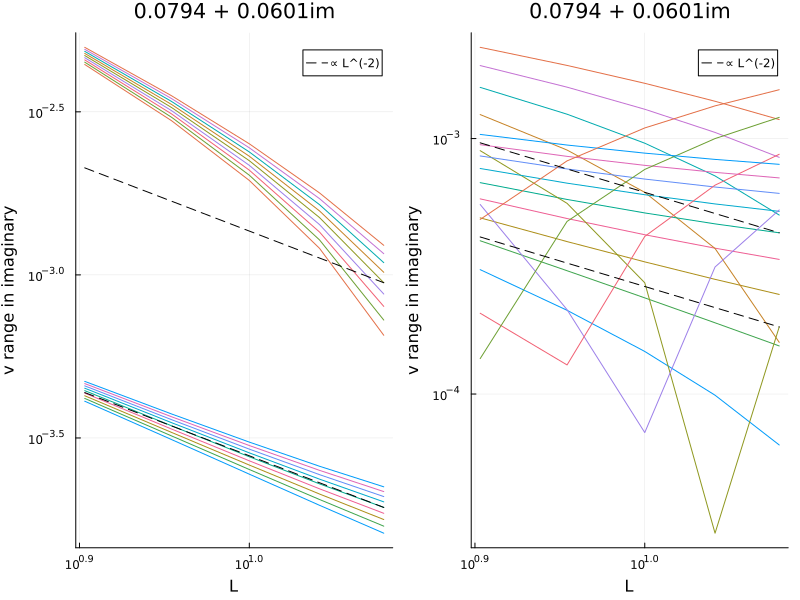

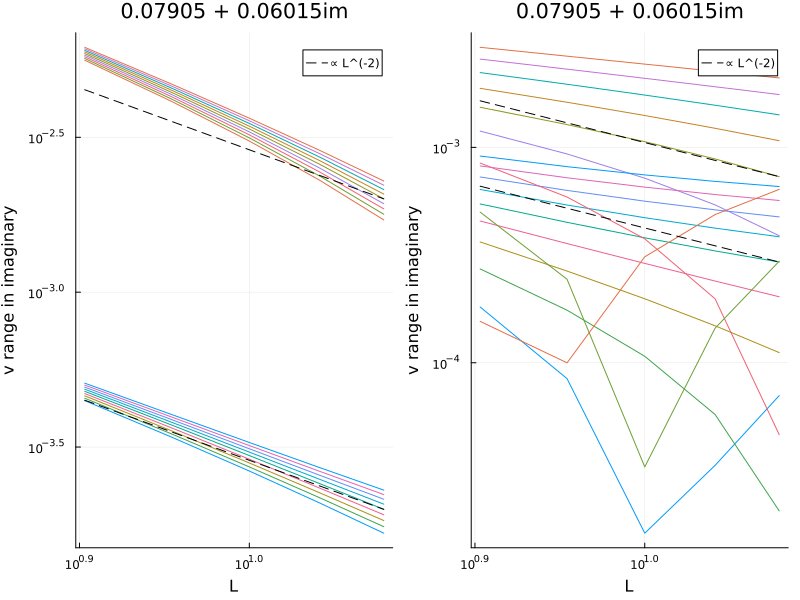

In [78]:
#for i=1:length(λ_list)
for i in 1:length(λ_list)
    plot_gap_scaling(i;fit_start_ind=4,num_levels=2,criteria = (1e-5,1e-6))
end

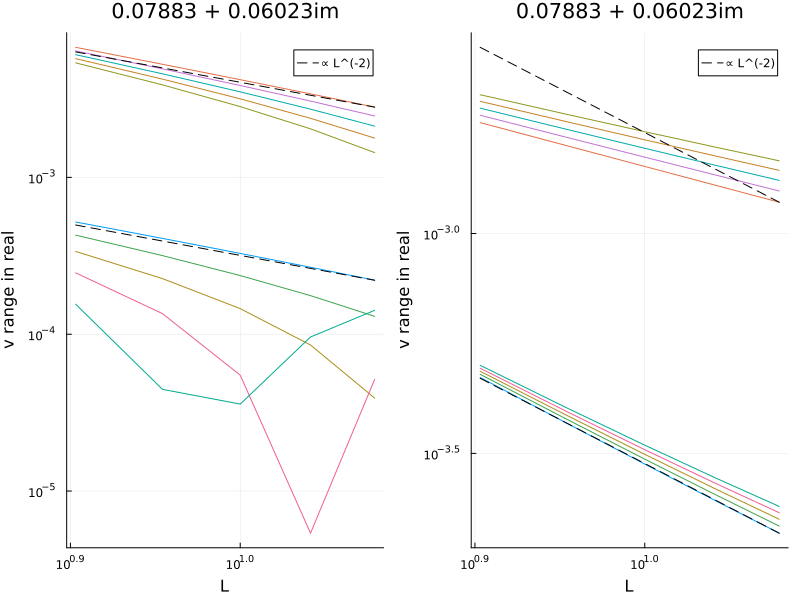

1




2




3




4




5




6




7




8




9




10




11




12




13




14




15




16




17




18




19




20




21




22






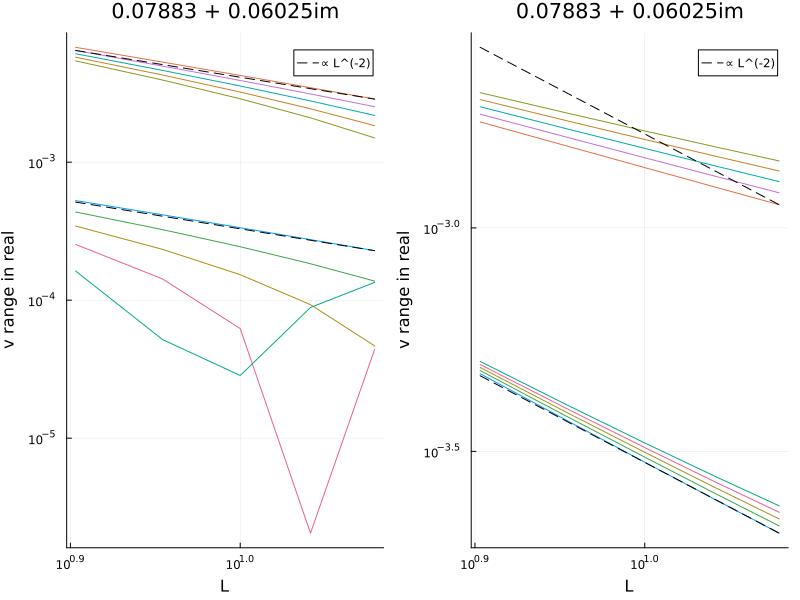

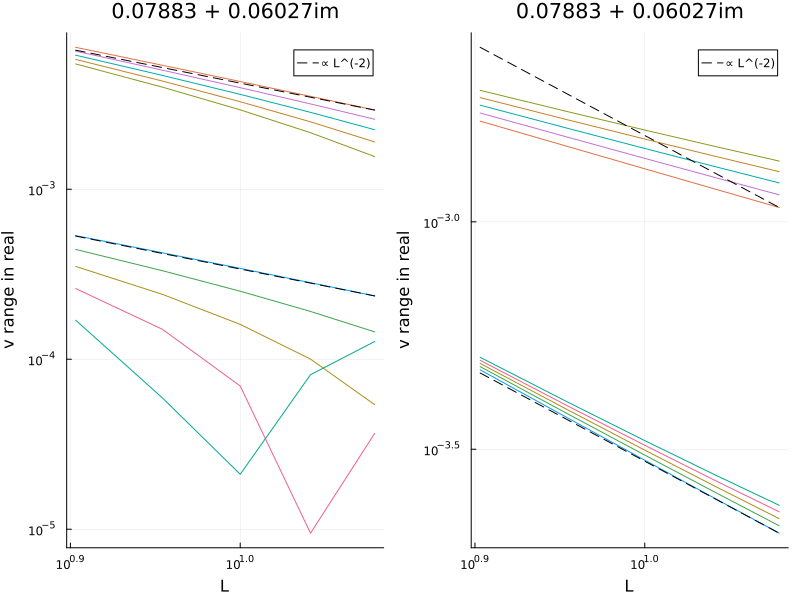

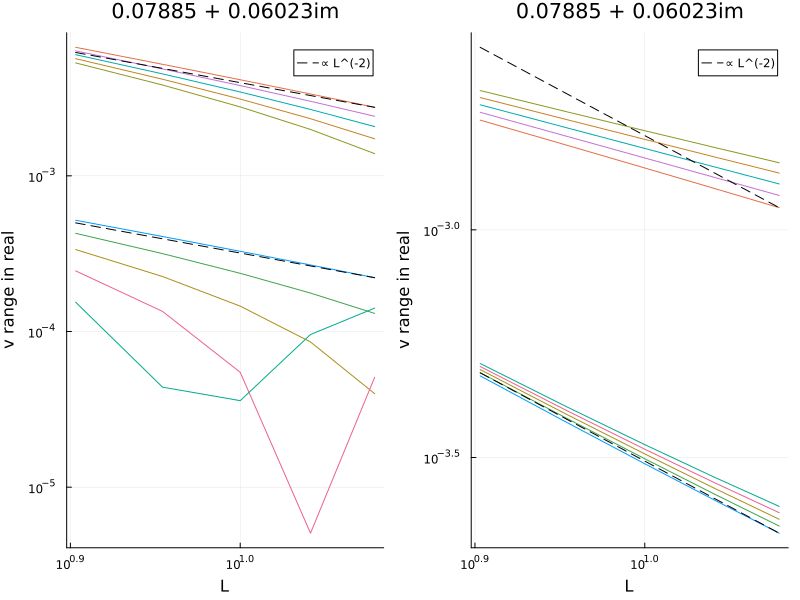

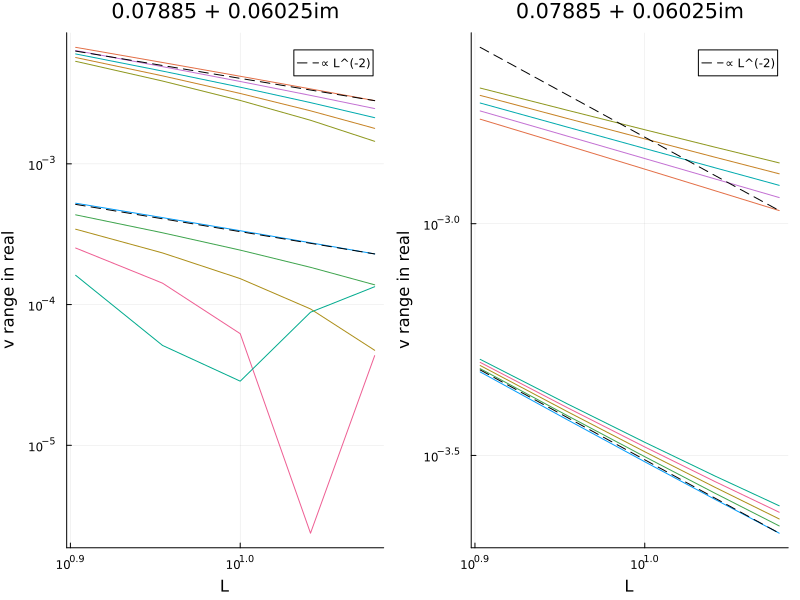

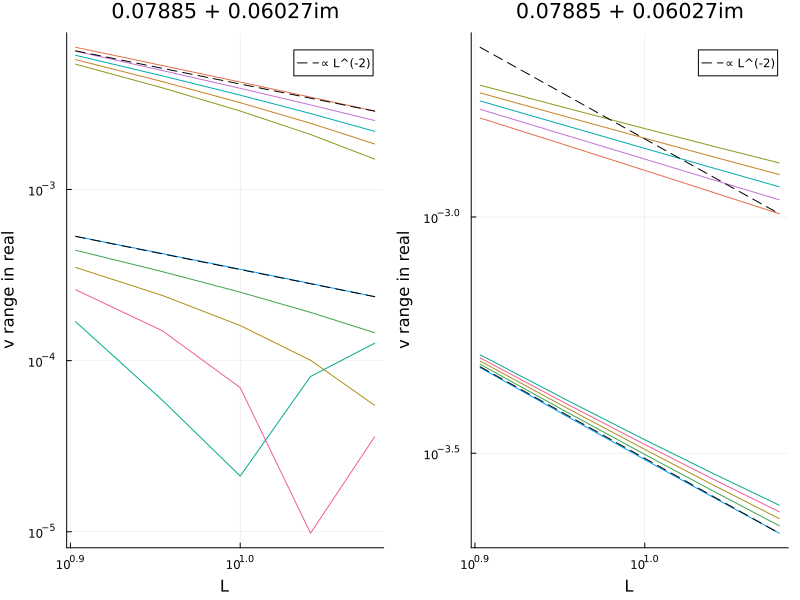

...

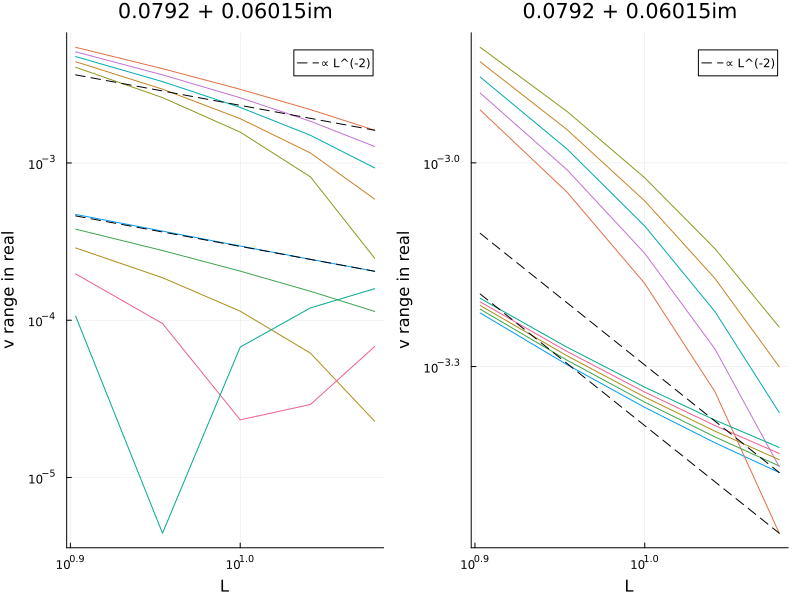

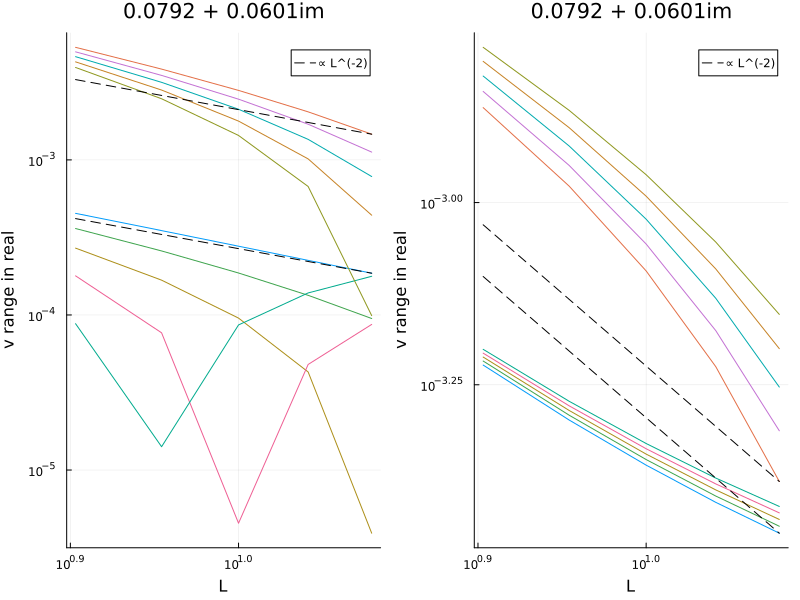

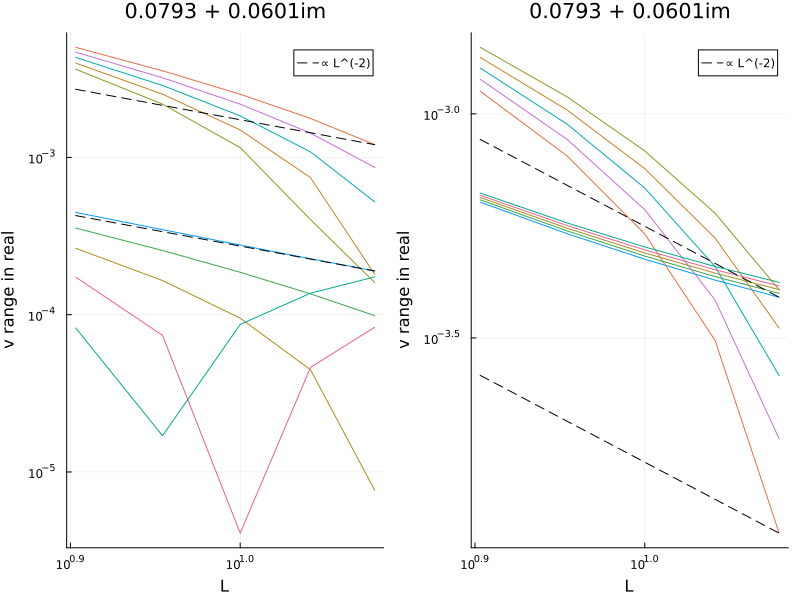

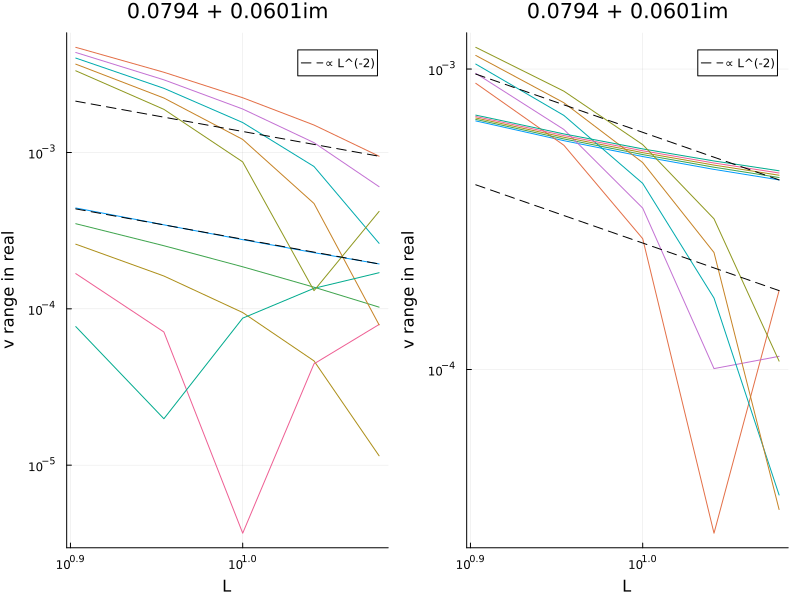

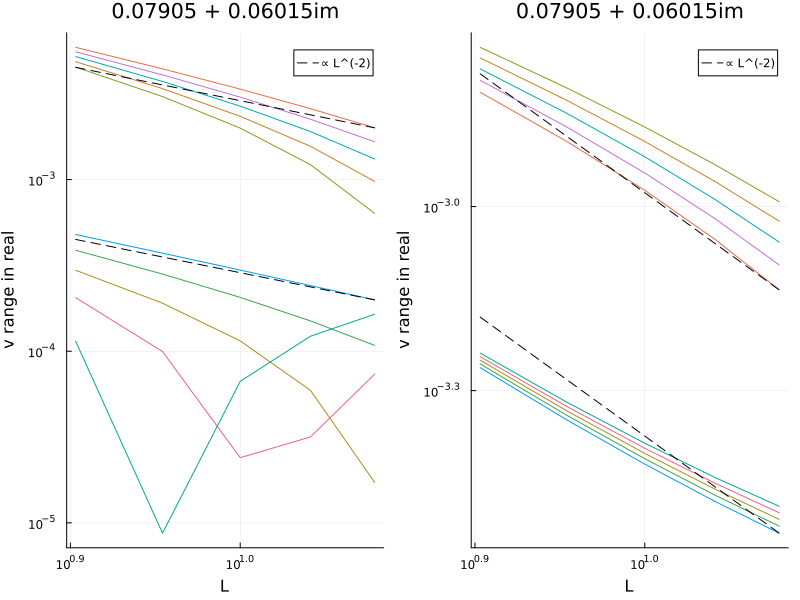

In [71]:
for i = 1:length(λ_list)
    println(i)
    plot_gap_scaling(i;fit_start_ind=4,num_levels=2,criteria=(1,1e-5))
    println("\n\n\n")
end